<a href="https://colab.research.google.com/github/VictorNigretto/ProjetLong/blob/main/Segmentation_avec_superpixels_%2B_mean_color_%2B_shadow_removal_%2B_KPPV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Install management

In [1]:
!pip install rasterio

     |████████████████████████████████| 19.1MB 32.7MB/s 


Import management


In [40]:
import os
import shutil
from tensorflow.python.client import device_lib
import keras
from keras import layers, models, optimizers
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.layers import Dense, Flatten, Dropout, Input
from keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.applications import EfficientNetB7, ResNet50
from keras.preprocessing import image
from keras.models import Model
from keras.callbacks import LearningRateScheduler
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib
from keras.preprocessing.image import load_img
from PIL import Image
from keras.utils import to_categorical 
import cv2
from google.colab.patches import cv2_imshow
import random
from keras.preprocessing.image import load_img
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
import matplotlib.pyplot as plt
import gc
import numpy as np
import pandas as pd
import rasterio
from skimage.color import lab2lch, rgb2lab, rgb2hsv, rgb2gray, hsv2rgb, lab2rgb
from skimage.exposure import rescale_intensity
from skimage.morphology import disk
from sklearn.cluster import KMeans
import scipy.misc
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import normalize

Upload files

In [3]:
from google.colab import files
uploaded = files.upload()

Saving 100_0001_0001.JPG to 100_0001_0001.JPG
Saving 100_0001_0002.JPG to 100_0001_0002.JPG
Saving 100_0001_0003.JPG to 100_0001_0003.JPG
Saving 100_0001_0004.JPG to 100_0001_0004.JPG
Saving 100_0001_0005.JPG to 100_0001_0005.JPG


In [4]:
uploaded = files.upload()

Saving 100_0001_0116.JPG to 100_0001_0116.JPG


Load basic image and resize

In [5]:
# image de base
image = load_img('100_0001_0116.JPG')
print("Image shape : ", np.shape(image))
image = np.array(image)
# image : l'image de  base resize
image = rescale(image, 0.50, multichannel=True, anti_aliasing=True)

matplotlib.image.imsave('100_0001_0116_resized.JPG', image)

Image shape :  (3648, 5472, 3)


Display image

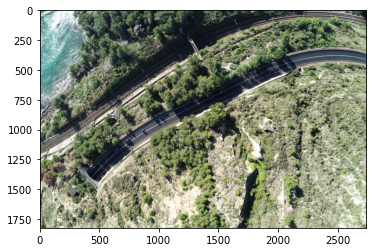

image reshaped shape :  (1824, 2736, 3)


In [6]:
plt.imshow(image)
plt.show()
print("image reshaped shape : ", np.shape(image))

Shadow Detection and Reconstruction in High-Resolution Satellite Images via Morphological Filtering and Example-Based Learning


In [7]:
def shadow_detection(image_file, shadow_mask_file, convolve_window_size = 5, num_thresholds = 3, struc_elem_size = 5):
    """
    This function is used to detect shadow - covered areas in an image, as proposed in the paper 
    'Near Real - Time Shadow Detection and Removal in Aerial Motion Imagery Application' by Silva G.F., Carneiro G.B., 
    Doth R., Amaral L.A., de Azevedo D.F.G. (2017)
    
    Inputs:
    - image_file: Path of image to be processed for shadow removal. It is assumed that the first 3 channels are ordered as
                  Red, Green and Blue respectively
    - shadow_mask_file: Path of shadow mask to be saved
    - convolve_window_size: Size of convolutional matrix filter to be used for blurring of specthem ratio image
    - num_thresholds: Number of thresholds to be used for automatic multilevel global threshold determination
    - struc_elem_size: Size of disk - shaped structuring element to be used for morphological closing operation
    
    Outputs:
    - shadow_mask: Shadow mask for input image
    
    """
    
    if (convolve_window_size % 2 == 0):
        raise ValueError('Please make sure that convolve_window_size is an odd integer')
        
    buffer = int((convolve_window_size - 1) / 2)
    
    
    with rasterio.open(image_file) as f:
        metadata = f.profile
        img = rescale_intensity(np.transpose(f.read(tuple(np.arange(metadata['count']) + 1)), [1, 2, 0]), out_range = 'uint8')
        img = img[:, :, 0 : 3]
    
    
    lch_img = np.float32(lab2lch(rgb2lab(img)))
    
    
    l_norm = rescale_intensity(lch_img[:, :, 0], out_range = (0, 1))
    h_norm = rescale_intensity(lch_img[:, :, 2], out_range = (0, 1))
    sr_img = (h_norm + 1) / (l_norm + 1)
    log_sr_img = np.log(sr_img + 1)
    
    del l_norm, h_norm, sr_img
    gc.collect()

    

    avg_kernel = np.ones((convolve_window_size, convolve_window_size)) / (convolve_window_size ** 2)
    blurred_sr_img = cv2.filter2D(log_sr_img, ddepth = -1, kernel = avg_kernel)
      
    
    del log_sr_img
    gc.collect()
    
                
    flattened_sr_img = blurred_sr_img.flatten().reshape((-1, 1))
    labels = KMeans(n_clusters = num_thresholds + 1, max_iter = 10000).fit(flattened_sr_img).labels_
    flattened_sr_img = flattened_sr_img.flatten()
    df = pd.DataFrame({'sample_pixels': flattened_sr_img, 'cluster': labels})
    threshold_value = df.groupby(['cluster']).min().max()[0]
    df['Segmented'] = np.uint8(df['sample_pixels'] >= threshold_value)
    
    
    del blurred_sr_img, flattened_sr_img, labels, threshold_value
    gc.collect()
    
    
    shadow_mask_initial = np.array(df['Segmented']).reshape((img.shape[0], img.shape[1]))
    struc_elem = disk(struc_elem_size)
    shadow_mask = np.expand_dims(np.uint8(cv2.morphologyEx(shadow_mask_initial, cv2.MORPH_CLOSE, struc_elem)), axis = 0)
    
    
    del df, shadow_mask_initial, struc_elem
    gc.collect()
    

    metadata['count'] = 1
    with rasterio.open(shadow_mask_file, 'w', **metadata) as dst:
        dst.write(shadow_mask)
        
    return shadow_mask



def shadow_correction(image_file, shadow_mask_file, corrected_image_file, exponent = 1):
    """
    This function is used to adjust brightness for shadow - covered areas in an image, as proposed in the paper 
    'Near Real - Time Shadow Detection and Removal in Aerial Motion Imagery Application' by Silva G.F., Carneiro G.B., 
    Doth R., Amaral L.A., de Azevedo D.F.G. (2017)
    
    Inputs:
    - image_file: Path of 3 - channel (red, green, blue) image to be processed for shadow removal
    - shadow_mask_file: Path of shadow mask for corresponding input image
    - corrected_image_file: Path of corrected image to be saved
    - exponent: Exponent to be used for the calculcation of statistics for unshaded and shaded areas
    
    Outputs:
    - corrected_img: Corrected input image
    
    """
    
    with rasterio.open(image_file) as f:
        metadata = f.profile
        img = rescale_intensity(np.transpose(f.read(tuple(np.arange(metadata['count']) + 1)), [1, 2, 0]), out_range = 'uint8')
        
    with rasterio.open(shadow_mask_file) as s:
        shadow_mask = s.read(1)
    
    corrected_img = np.zeros((img.shape), dtype = np.uint8)
    non_shadow_mask = np.uint8(shadow_mask == 0)
    
    
    for i in range(img.shape[2]):
        shadow_area_mask = shadow_mask * img[:, :, i]
        non_shadow_area_mask = non_shadow_mask * img[:, :, i]
        shadow_stats = np.float32(np.mean(((shadow_area_mask ** exponent) / np.sum(shadow_mask))) ** (1 / exponent))
        non_shadow_stats = np.float32(np.mean(((non_shadow_area_mask ** exponent) / np.sum(non_shadow_mask))) ** (1 / exponent))
        mul_ratio = ((non_shadow_stats - shadow_stats) / shadow_stats) + 1
        corrected_img[:, :, i] = np.uint8(non_shadow_area_mask + np.clip(shadow_area_mask * mul_ratio, 0, 255))
    

    with rasterio.open(corrected_image_file, 'w', **metadata) as dst:
        dst.write(np.transpose(corrected_img, [2, 0, 1]))
        
    return corrected_img

In [8]:
mask = shadow_detection("/content/100_0001_0116_resized.JPG", "/content/shadow_image.JPG")

/usr/local/lib/python3.7/dist-packages/rasterio/__init__.py:207: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.7/dist-packages/rasterio/__init__.py:223: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  **kwargs)


In [9]:
corrected_image = shadow_correction("/content/100_0001_0116_resized.JPG", "/content/shadow_image.JPG", "/content/corrected_image.JPG")

/usr/local/lib/python3.7/dist-packages/rasterio/__init__.py:207: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.7/dist-packages/rasterio/__init__.py:223: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  **kwargs)


Segmentation with quickshift

Quickshift number of segments: 8744


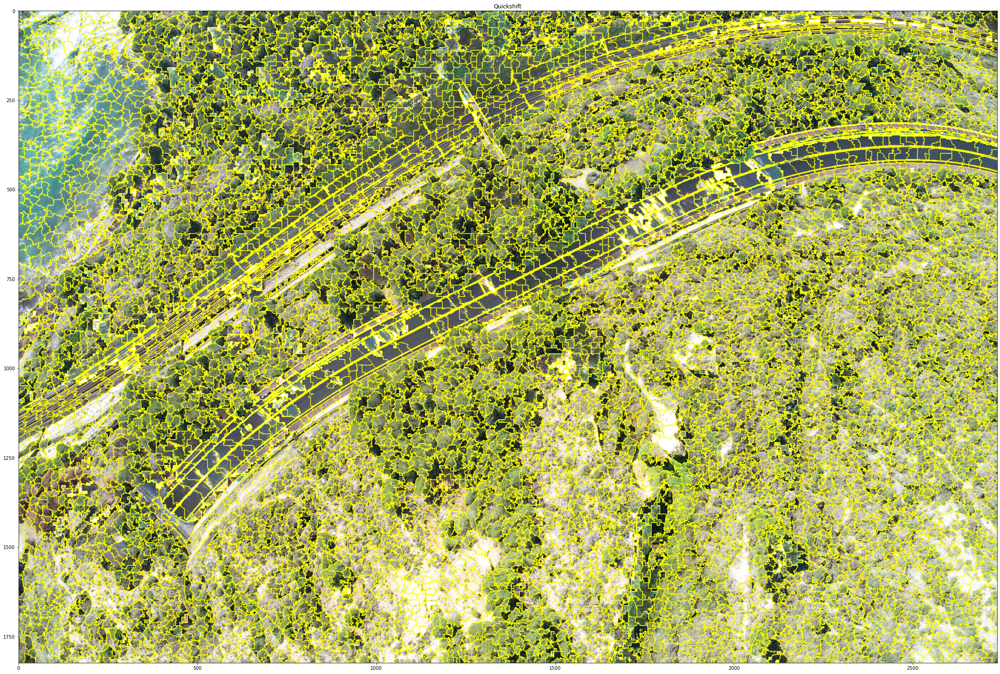

In [28]:
# Passage de l'image en float pour quickshift
img = img_as_float(corrected_image)

# segments_quick c'est l'image labélisée par super pixels
segments_quick = quickshift(img, kernel_size=3, max_dist=20, ratio=0.5)

#gradient = sobel(rgb2gray(img))
#segments_watershed = watershed(gradient, markers=250, compactness=0.001)

print(f"Quickshift number of segments: {len(np.unique(segments_quick))}")
#print(f"Compact Watershed number of segments: {len(np.unique(segments_watershed))}")
fig, ax = plt.subplots(1, 1, figsize=(30, 30), sharex=True, sharey=True)

# Fonction sklearn qui affiche les superpixels
ax.imshow(mark_boundaries(img, segments_quick))
ax.set_title('Quickshift')

#ax[1].imshow(mark_boundaries(img, segments_watershed))
#ax[1].set_title('Compact watershed')


plt.tight_layout()
plt.show()

Mean color function

In [29]:
def mean_color(image=image, segments=segments_quick):
  img_reshaped = image.reshape((image.shape[0]*image.shape[1],image.shape[2]))
  print("img reshaped shape", np.shape(img_reshaped))

  segments_reshaped = np.reshape(segments, -1)    
  print("segment reshaped shape", np.shape(segments_reshaped))

  unique_segments = np.unique(segments_reshaped)
  print("unique segment shape", np.shape(unique_segments))
  img_temp = np.zeros(img_reshaped.shape)

  for i in unique_segments:
    loc=np.where(segments_reshaped==i)[0]
    #print(loc)
    means=np.mean(img_reshaped[loc, :], axis=0)
    img_temp[loc, :] = means

  return np.reshape(img_temp, [image.shape[0], image.shape[1], image.shape[2]])

In [30]:
# mean_img : l'image des couleurs moyennes
mean_img = mean_color(img, segments_quick)

img reshaped shape (4990464, 3)
segment reshaped shape (4990464,)
unique segment shape (8744,)


In [25]:
mask = mask[0, :, :]

IndexError: ignored

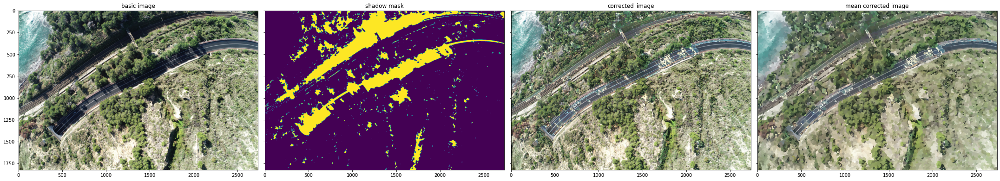

In [31]:
# Affichage
fig, ax = plt.subplots(1, 4, figsize=(30, 30), sharex=True, sharey=True)

#ax[0].imshow(image)
#ax[0].set_title('Original resized image')

ax[0].imshow(image)
ax[0].set_title('basic image')

ax[1].imshow(mask)
ax[1].set_title('shadow mask')

ax[2].imshow(corrected_image)
ax[2].set_title('corrected_image')

ax[3].imshow(mean_img)
ax[3].set_title('mean corrected image')

plt.tight_layout()
plt.show()


Color_names function

In [19]:
#print(mean_values[0:20])
#plt.imshow(typical_water)

In [35]:


# fonction qui calcule le nuage de point des images RGB
def cloud_repartition_rgb_img(img=mean_img, segments=segments_quick):
  img_reshaped = img.reshape((img.shape[0]*img.shape[1], img.shape[2]))
  print("img reshaped shape :", np.shape(img_reshaped))
  segments_reshaped = np.reshape(segments, -1)    
  print("segment reshaped shape", np.shape(segments_reshaped))

  unique_segments = np.unique(segments_reshaped)
  print("unique segment shape", np.shape(unique_segments))
  img_unique_pixels = np.zeros((unique_segments.shape[0], 3))
  print("img unique pixel shape :", np.shape(img_unique_pixels))

  for i in unique_segments:
    loc=np.where(segments_reshaped==i)[0][0]
    #print(loc)
    img_unique_pixels[i, :] = img_reshaped[loc, :]

  img_unique_pixels = 255*img_unique_pixels
  print(np.shape(img_unique_pixels))
  # Création de la figure
  fig = plt.figure()
  ax3D = fig.add_subplot(111, projection='3d')

  # Tracé
  p3d = ax3D.scatter(img_unique_pixels[:, 0], img_unique_pixels[:, 1], img_unique_pixels[:, 2], zdir='z', s=20, c='red', depthshade=True) 


  # Axes
  ax3D.set_xlabel('R Label')
  ax3D.set_ylabel('G Label')
  ax3D.set_zlabel('B Label')

In [36]:
# fonction qui calcule le nuage de point des images hsv
def cloud_repartition_hsv_img(img=mean_img, segments=segments_quick):
  img = rgb2hsv(img)
  #print(img)
  img_reshaped = img.reshape((img.shape[0]*img.shape[1], img.shape[2]))
  print("img reshaped shape :", np.shape(img_reshaped))
  segments_reshaped = np.reshape(segments, -1)    
  print("segment reshaped shape", np.shape(segments_reshaped))

  unique_segments = np.unique(segments_reshaped)
  print("unique segment shape", np.shape(unique_segments))
  img_unique_pixels = np.zeros((unique_segments.shape[0], 3))
  print("img unique pixel shape :", np.shape(img_unique_pixels))

  for i in unique_segments:
    loc=np.where(segments_reshaped==i)[0][0]
    #print(loc)
    img_unique_pixels[i, :] = img_reshaped[loc, :]

  # Création de la figure
  fig = plt.figure()
  ax3D = fig.add_subplot(111, projection='3d')

  # Tracé
  p3d = ax3D.scatter(img_unique_pixels[:, 0], img_unique_pixels[:, 1], img_unique_pixels[:, 2], zdir='z', s=20, c='red', depthshade=True) 


  # Axes
  ax3D.set_xlabel('H Label')
  ax3D.set_ylabel('S Label')
  ax3D.set_zlabel('V Label')

In [37]:
# fonction qui calcule le nuage de point des images lab
def cloud_repartition_lab_img(img=mean_img, segments=segments_quick):
  img = rgb2lab(img)
  img_reshaped = img.reshape((img.shape[0]*img.shape[1], img.shape[2]))
  print("img reshaped shape :", np.shape(img_reshaped))
  segments_reshaped = np.reshape(segments, -1)    
  print("segment reshaped shape", np.shape(segments_reshaped))

  unique_segments = np.unique(segments_reshaped)
  print("unique segment shape", np.shape(unique_segments))
  img_unique_pixels = np.zeros((unique_segments.shape[0], 3))
  print("img unique pixel shape :", np.shape(img_unique_pixels))

  for i in unique_segments:
    loc=np.where(segments_reshaped==i)[0][0]
    #print(loc)
    img_unique_pixels[i, :] = img_reshaped[loc, :]

  #img_unique_pixels = 255*img_unique_pixels
  print(np.shape(img_unique_pixels))
  # Création de la figure
  fig = plt.figure()
  ax3D = fig.add_subplot(111, projection='3d')

  # Tracé
  p3d = ax3D.scatter(img_unique_pixels[:, 0], img_unique_pixels[:, 1], img_unique_pixels[:, 2], zdir='z', s=20, c='red', depthshade=True) 


  # Axes
  ax3D.set_xlabel('L Label')
  ax3D.set_ylabel('A Label')
  ax3D.set_zlabel('B Label')


img reshaped shape : (4990464, 3)
segment reshaped shape (4990464,)
unique segment shape (8744,)
img unique pixel shape : (8744, 3)
(8744, 3)
img reshaped shape : (4990464, 3)
segment reshaped shape (4990464,)
unique segment shape (8744,)
img unique pixel shape : (8744, 3)
img reshaped shape : (4990464, 3)
segment reshaped shape (4990464,)
unique segment shape (8744,)
img unique pixel shape : (8744, 3)
(8744, 3)


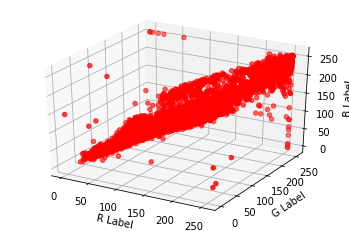

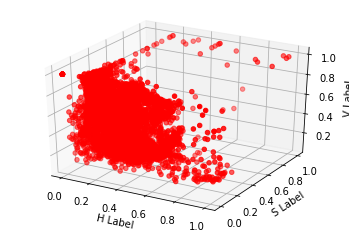

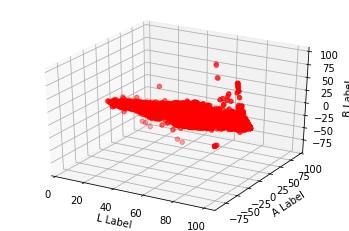

In [41]:
# Affichage
cloud_repartition_rgb_img()
cloud_repartition_hsv_img()
cloud_repartition_lab_img()

In [42]:
# Ce bloc de code sert à définir img_unique_pixels_rgb qui donne la couleur moyenne de chacun des superpixels (376)
img_reshaped = mean_img.reshape((mean_img.shape[0]*mean_img.shape[1], mean_img.shape[2]))
segments_reshaped = np.reshape(segments_quick, -1)    
unique_segments = np.unique(segments_reshaped)
img_unique_pixels_rgb = np.zeros((unique_segments.shape[0], 3))
print("img unique pixel shape :", np.shape(img_unique_pixels_rgb))

for i in unique_segments:
  loc=np.where(segments_reshaped==i)[0][0]
  #print(loc)
  img_unique_pixels_rgb[i, :] = img_reshaped[loc, :]

img unique pixel shape : (8744, 3)


In [43]:
# Ce bloc de code sert à définir img_unique_pixels_hsv qui donne la couleur hsv moyenne de chacun des superpixels (376)
mean_img_hsv = rgb2hsv(mean_img)
img_reshaped = mean_img.reshape((mean_img_hsv.shape[0]*mean_img_hsv.shape[1], mean_img_hsv.shape[2]))
segments_reshaped = np.reshape(segments_quick, -1)    
unique_segments = np.unique(segments_reshaped)
img_unique_pixels_hsv = np.zeros((unique_segments.shape[0], 3))
print("img unique pixel shape :", np.shape(img_unique_pixels_hsv))

for i in unique_segments:
  loc=np.where(segments_reshaped==i)[0][0]
  #print(loc)
  img_unique_pixels_hsv[i, :] = img_reshaped[loc, :]

img unique pixel shape : (8744, 3)


In [44]:
# Ce bloc de code sert à définir img_unique_pixels_lab qui donne la couleur hsv moyenne de chacun des superpixels (376)
mean_img_lab = rgb2hsv(mean_img)
img_reshaped = mean_img.reshape((mean_img_lab.shape[0]*mean_img_lab.shape[1], mean_img_lab.shape[2]))
segments_reshaped = np.reshape(segments_quick, -1)    
unique_segments = np.unique(segments_reshaped)
img_unique_pixels_lab = np.zeros((unique_segments.shape[0], 3))
print("img unique pixel shape :", np.shape(img_unique_pixels_lab))

for i in unique_segments:
  loc=np.where(segments_reshaped==i)[0][0]
  #print(loc)
  img_unique_pixels_lab[i, :] = img_reshaped[loc, :]

img unique pixel shape : (8744, 3)


In [45]:
# Yellow / Brown
yellow_class = np.array([[133, 127, 104], [168, 165, 137], [85, 73, 66], [102, 102, 0], [153, 153, 0], [216, 212, 186], [226, 230, 211]])
green_class = np.array([[104, 118, 71], [106, 122, 73], [79, 95, 60], [51, 102, 0], [0, 102, 0], [142, 155, 100]])
blue_class = np.array([[114, 142, 142], [98, 151, 149], [221, 226, 228], [136, 153, 155], [0, 152, 152]])
black_class = np.array([[24, 30, 30], [28, 39, 35], [57, 61, 69], [121, 118, 101], [64, 64, 64], [68, 81, 95]])

yellow_labels = np.array(['yellow']*np.shape(yellow_class)[0])
green_labels = np.array(['green']*np.shape(green_class)[0])
blue_labels = np.array(['blue']*np.shape(blue_class)[0])
black_labels = np.array(['black']*np.shape(black_class)[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


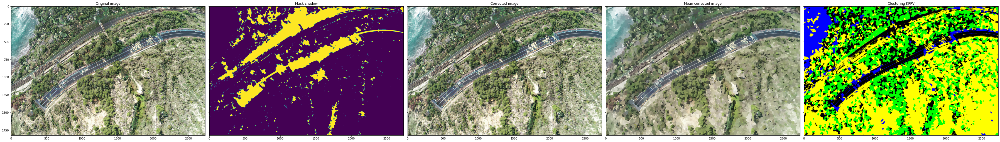

In [54]:
classes = np.concatenate((yellow_class, green_class, blue_class, black_class))
labels = np.concatenate((yellow_labels, green_labels, blue_labels, black_labels))

from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=1)
neigh.fit(classes, labels)

img_unique_pixels_rgb_temp = img_unique_pixels_rgb*255
prediction_class = neigh.predict(img_unique_pixels_rgb_temp)


# Transform prediction into RGB vectors
img_temp_rgb = np.zeros(img_reshaped.shape)
for i in unique_segments:
    loc=np.where(segments_reshaped==i)[0]
    if (prediction_class[i] == 'black') :
      img_temp_rgb[loc, :] = [0, 0, 0]
    if (prediction_class[i] == 'blue') :
      img_temp_rgb[loc, :] = [0, 0, 255]
    if (prediction_class[i] == 'green') :
      img_temp_rgb[loc, :] = [0, 255, 0]
    if (prediction_class[i] == 'yellow') :
      img_temp_rgb[loc, :] = [255, 255, 0]

# Reshape into real image
img_temp_rgb = np.reshape(img_temp_rgb, [img.shape[0], img.shape[1], img.shape[2]])

# plot img
fig, ax = plt.subplots(1, 5, figsize=(50, 50), sharex=True, sharey=True)

ax[0].imshow(img)
ax[0].set_title('Original image')

ax[1].imshow(mask)
ax[1].set_title('Mask shadow')

ax[2].imshow(corrected_image)
ax[2].set_title('Corrected image')

ax[3].imshow(mean_img)
ax[3].set_title('Mean corrected image')

ax[4].imshow(img_temp_rgb)
ax[4].set_title('Clusturing KPPV')


plt.tight_layout()
plt.show()